# Automobile Dataset:  
## Phase -1 : Data preparation

a. Clean the non-numeric values in the numeric columns

b. Converting the Integer encode text data

c. Deriving new fields based on the available data

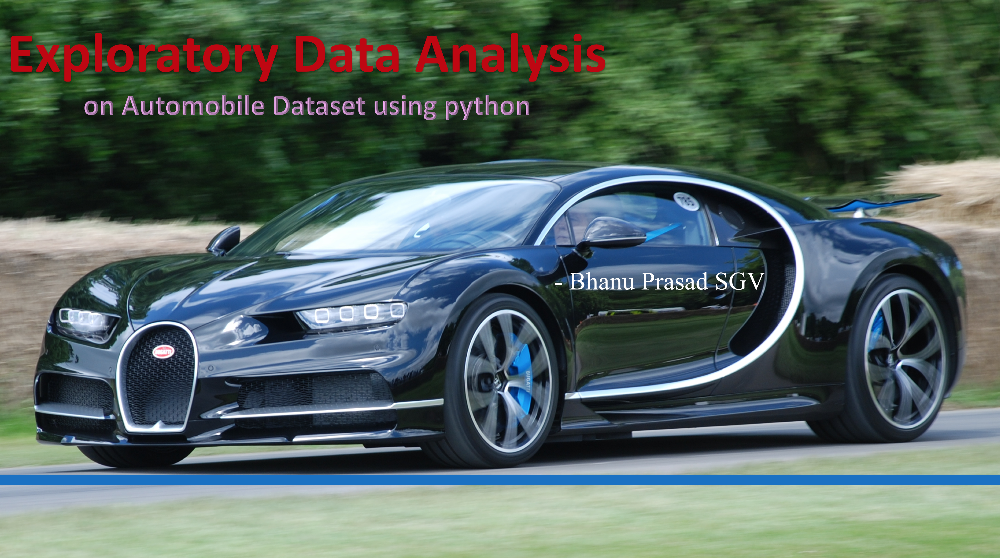

In [1]:
#import libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

sns.set()
from subprocess import check_output

In [2]:
#import dataset
auto_data = pd.read_csv("https://raw.githubusercontent.com/insaid2018/Term-1/master/Data/Projects/Automobile_data.csv")

In [3]:
auto_data = pd.DataFrame(auto_data)

In [4]:
auto_data.shape

(205, 26)

In [5]:
auto_data.columns

Index(['symboling', 'normalized-losses', 'make', 'fuel-type', 'aspiration',
       'num-of-doors', 'body-style', 'drive-wheels', 'engine-location',
       'wheel-base', 'length', 'width', 'height', 'curb-weight', 'engine-type',
       'num-of-cylinders', 'engine-size', 'fuel-system', 'bore', 'stroke',
       'compression-ratio', 'horsepower', 'peak-rpm', 'city-mpg',
       'highway-mpg', 'price'],
      dtype='object')

In [6]:
auto_data.head()

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.4,10.0,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.4,8.0,115,5500,18,22,17450


In [7]:
auto_data.tail()

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
200,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845
201,-1,95,volvo,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045
202,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,...,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485
203,-1,95,volvo,diesel,turbo,four,sedan,rwd,front,109.1,...,145,idi,3.01,3.4,23.0,106,4800,26,27,22470
204,-1,95,volvo,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114,5400,19,25,22625


In [8]:
auto_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
symboling            205 non-null int64
normalized-losses    205 non-null object
make                 205 non-null object
fuel-type            205 non-null object
aspiration           205 non-null object
num-of-doors         205 non-null object
body-style           205 non-null object
drive-wheels         205 non-null object
engine-location      205 non-null object
wheel-base           205 non-null float64
length               205 non-null float64
width                205 non-null float64
height               205 non-null float64
curb-weight          205 non-null int64
engine-type          205 non-null object
num-of-cylinders     205 non-null object
engine-size          205 non-null int64
fuel-system          205 non-null object
bore                 205 non-null object
stroke               205 non-null object
compression-ratio    205 non-null float64
horsepower           205 non-nul

In [9]:
auto_data.describe()

,symboling,wheel-base,length,width,height,curb-weight,engine-size,compression-ratio,city-mpg,highway-mpg
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,0.834146,98.756585,174.049268,65.907805,53.724878,2555.565854,126.907317,10.142537,25.219512,30.751220
std,1.245307,6.021776,12.337289,2.145204,2.443522,520.680204,41.642693,3.972040,6.542142,6.886443
min,-2.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,7.000000,13.000000,16.000000
25%,0.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,8.600000,19.000000,25.000000
50%,1.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,9.000000,24.000000,30.000000
75%,2.000000,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,9.400000,30.000000,34.000000
max,3.000000,120.900000,208.100000,72.300000,59.800000,4066.000000,326.000000,23.000000,49.000000,54.000000


In [ ]:
auto_data.isnull().sum()

# Pandas Preprofiling

In [12]:
import pandas_profiling

In [13]:
auto_profile = pandas_profiling.ProfileReport(auto_data)
auto_profile.to_file(output_file="auto_data_before_preprocessing.html")

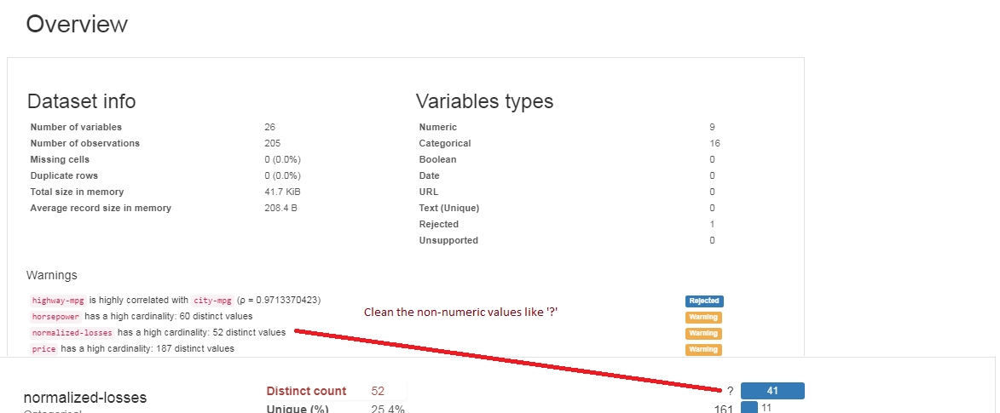

# Preprocessing
Data is not having any missing values. 
Columns like normalised-losses, horsepower, engine-type, num-of-doors, peak-rpm, price, bore, stroke are having non-integer values.

### Find columns that need cleaning
List of columns that is having '?' symbol

In [14]:
# Listing the columns which are containing the non-numeric values, where numeric values are requried.
autoDataColumns = auto_data.columns
for autoIter in autoDataColumns:
    if('?'in auto_data[autoIter].unique()) or ('l' in auto_data[autoIter].unique()):
        auto_non = auto_data[auto_data[autoIter].isin(['?', 'l'])].shape[0]
        print(autoIter + " : " + str(auto_non))

normalized-losses : 41
num-of-doors : 2
engine-type : 12
bore : 4
stroke : 4
horsepower : 2
peak-rpm : 2
price : 4


C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  after removing the cwd from sys.path.


# Clean the data 
clean the non-numeric values in the numeric columns

In [15]:
auto_data.replace("?", np.NAN, inplace=True)

In [16]:
auto_data.isnull().sum()

symboling             0
normalized-losses    41
make                  0
fuel-type             0
aspiration            0
num-of-doors          2
body-style            0
drive-wheels          0
engine-location       0
wheel-base            0
length                0
width                 0
height                0
curb-weight           0
engine-type           0
num-of-cylinders      0
engine-size           0
fuel-system           0
bore                  4
stroke                4
compression-ratio     0
horsepower            2
peak-rpm              2
city-mpg              0
highway-mpg           0
price                 4
dtype: int64

### Cleaning the normalized-losses data

a. Convert "normalized-losses" column to numeric. In the process, insert NaNs where values cannot be converted to a number
b. Under each make, if there are enough number of records with valid loss values (>=50%), find their mean value and replace NaNs.
c. If more than 50% records under a make have NaNs for loss value, those records have to be discarded for analysis.

In [18]:
# auto_data is a dataFrame for analysis
clean_autodata = auto_data
#Converting the "normalized-Losses" column to numeric

clean_autodata['normalized-losses'] = pd.to_numeric(clean_autodata['normalized-losses'], errors='coerce')

#groupby make to find the NAN's of normalized-losses
autodata_nan = clean_autodata[clean_autodata['normalized-losses'].isnull()].groupby(by='make', as_index=False).size().reset_index()
autodata_nan.columns = ['make', 'nanscount']

# To find the car make w.r.to the records count under each make
autodata_group = clean_autodata.groupby(by='make', as_index=False).size().reset_index()
autodata_group.columns = ['make', 'makecount']

autodata_group_nan = autodata_group.merge(autodata_nan,on="make", how="left", suffixes=['', '_right'])

# To find the car makes having more than 50% records with valid normalized-losses values
autoMean_nan_autoMakes = autodata_group_nan[autodata_group_nan['nanscount']*100/autodata_group_nan['makecount'] <= 50].reset_index()
autoMean_nan_autoMakes['nlimpute'] = autoMean_nan_autoMakes['make']

# Find the mean loss figures for those makes
auto_nl = clean_autodata.merge(autoMean_nan_autoMakes, on="make", how="left", suffixes=['','_right'])
auto_nl_by_make = auto_nl.groupby(by='nlimpute')['normalized-losses'].mean().reset_index()

# Replace NAN values with the calculated mean
autoData_right = clean_autodata.merge(auto_nl_by_make, how="left", left_on="make", right_on="nlimpute", suffixes=['', '_right'])

autoData_right['normalized-losses'] = np.where(autoData_right['normalized-losses'].isnull(), autoData_right['normalized-losses_right'], autoData_right['normalized-losses'])

auto_data = autoData_right.loc[autoData_right['normalized-losses'].isnull()==False].copy()

print("Normalized-losses column has" + str(auto_data['normalized-losses'].count()) + "values after cleaning") 

Normalized-losses column has189values after cleaning


### Cleaning the price data

Calculate the average price per make and impute the missing price values with the respective make's average price.

In [19]:
#Clearing the price data
auto_data['price'] = pd.to_numeric(auto_data['price'],errors='coerce')
meanGroupbypricemake = auto_data.groupby(by=['make'])['price'].mean().reset_index()

auto_data = auto_data.merge(meanGroupbypricemake,on='make', suffixes=['','_right'])
auto_data['price'] = np.where(auto_data['price'].isnull(), auto_data['price_right'], auto_data['price'])

### Cleaning the num-of-doors data
Remove records where number of doors having null

In [20]:
auto_data = auto_data[auto_data['num-of-doors'].notna()] # Remove 'num-of-doors' values.
auto_data.shape

(187, 29)

### Cleaning the Bore & Stroke data
Remove records where Bore & Stroke having null.

In [21]:
auto_data = auto_data[auto_data['bore'].notna()]
auto_data = auto_data[auto_data['stroke'].notna()]

### Cleaning the peak-rpm data
Convert peak-rpm data in to numeric.

In [22]:
# Convert the non-numeric data to null and convert the datatype.
auto_data['peak-rpm'] = pd.to_numeric(auto_data['peak-rpm'], errors='coerce')

### Cleaning the horsepower data
Convert to numeric value

In [23]:
auto_data['horsepower'] = pd.to_numeric(auto_data['horsepower'], errors="coerce")
auto_data.shape

(183, 29)

Drop the temporary columns or data

In [24]:
del auto_data['normalized-losses_right']
del auto_data['price_right']
del auto_data['nlimpute']

### Convert text columns to integer
Following columns are non-numeric or text forms and need to be interpreted into integer/numeric form.

num-of-doors
num-of-cylinders

In [25]:
auto_data["num-of-doors"].unique()

array(['four', 'two'], dtype=object)

In [26]:
auto_data["num-of-cylinders"].unique()

array(['four', 'five', 'six', 'three', 'eight'], dtype=object)

In [31]:

def autoDatastring2Number(strData):
    strDict = {'two':2, 'three':3, 'four':4, 'five':5, 'six':6, 'eight':8, 'twelve':12}
    if(strData in strDict):
        return strDict[strData]
    return 0

auto_data['num_cylinders'] = auto_data['num-of-cylinders'].apply(lambda cylinString: autoDatastring2Number(cylinString))

auto_data['num_doors'] = auto_data['num-of-doors'].apply(lambda doorString: autoDatastring2Number(doorString))

In [32]:
auto_data.columns

Index(['symboling', 'normalized-losses', 'make', 'fuel-type', 'aspiration',
       'num-of-doors', 'body-style', 'drive-wheels', 'engine-location',
       'wheel-base', 'length', 'width', 'height', 'curb-weight', 'engine-type',
       'num-of-cylinders', 'engine-size', 'fuel-system', 'bore', 'stroke',
       'compression-ratio', 'horsepower', 'peak-rpm', 'city-mpg',
       'highway-mpg', 'price', 'num_cylinders', 'num_doors'],
      dtype='object')

### Adding New Column Area, from length, width, height

In [33]:
auto_data['Area'] = auto_data['length'] * auto_data['width'] * auto_data['height']

### Deriving the new Columns
A. Convert the engine size from cubic inches to cubic centimeters (cc) for easier understanding. Dividing the cubic inch value by 0.061024 

B. Calculate horsepower to curbweight ratio of the vehicles. This is calculated to show the performance of the car

In [34]:
auto_data['engine_size_cc'] = auto_data['engine-size'].apply(lambda engineSize: int(engineSize/0.061024))
auto_data['hp2cw_ratio'] = pd.to_numeric(auto_data['horsepower'],errors='coerce')/auto_data['curb-weight']

In [ ]:
auto_data.describe()

C. Create two columns - Risky and Safe based on symboling data.

In [36]:
def autoDataRiskanalysis(autoSymbolingData):
    if (autoSymbolingData > 0):
        return 'RISK'
    return 'SAFE'

def autoDatarisky(autoDatariskydata):
    if (autoDatariskydata > 0):
        return 1
    return 0
    
auto_data['risk_analysis'] = auto_data['symboling'].apply(lambda autoSymbolingData: autoDataRiskanalysis(autoSymbolingData))
auto_data['risky'] = auto_data['symboling'].apply(lambda autoDatariskydata: autoDatarisky(autoDatariskydata))

#### Replace Drive-Wheels value with descriptive columns

In [37]:
# Replace the abbrevation to meaningful descriptive text for Drive-Wheels.

def autoDatadrivewheelsdestext(autoDataDrivewheels):
    '''
    Get the descriptive text for Drive-Wheels.
    '''
    switcher = {
        "4wd": "Four Wheel Drive",
        "fwd": "Front Wheel Drive",
        "rwd": "Rear Wheel Drive"
    }
    return switcher.get(autoDataDrivewheels)

# get_descriptive_text("4wd")
auto_data['drive-wheels'] = auto_data['drive-wheels'].apply(lambda autoDataDrivewheels: autoDatadrivewheelsdestext(autoDataDrivewheels))

In [38]:
auto_data.head(2)

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,city-mpg,highway-mpg,price,num_cylinders,num_doors,Area,engine_size_cc,hp2cw_ratio,risk_analysis,risky
0,2,164.0,audi,gas,std,four,sedan,Front Wheel Drive,front,99.8,...,24,30,13950.0,4,4,634816.956,1786,0.043646,RISK,1
1,2,164.0,audi,gas,std,four,sedan,Four Wheel Drive,front,99.4,...,18,22,17450.0,5,4,636734.832,2228,0.040722,RISK,1


In [39]:
auto_data.describe()

,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price,num_cylinders,num_doors,Area,engine_size_cc,hp2cw_ratio,risky
count,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000,183.000000
mean,0.737705,124.274446,99.145355,174.287978,65.909836,54.009836,2542.054645,125.196721,10.185355,100.295082,5095.628415,25.666667,31.098361,12709.858834,4.349727,3.202186,622982.620219,2051.038251,0.038940,0.530055
std,1.207599,35.718009,5.979826,12.574952,2.116007,2.328635,518.033610,37.826884,4.078702,33.713080,469.635718,6.338729,6.813138,7438.115517,0.843910,0.982034,80578.504031,619.911154,0.007719,0.500465
min,-2.000000,65.000000,86.600000,141.100000,60.300000,49.400000,1488.000000,61.000000,7.000000,48.000000,4150.000000,14.000000,16.000000,5118.000000,3.000000,2.000000,452643.156000,999.000000,0.019936,0.000000
25%,0.000000,95.000000,94.500000,166.300000,64.000000,52.500000,2128.000000,97.500000,8.500000,70.000000,4800.000000,20.500000,25.000000,7649.000000,4.000000,2.000000,567911.680000,1597.000000,0.034139,0.000000
50%,1.000000,119.000000,97.200000,173.400000,65.500000,54.300000,2405.000000,110.000000,9.000000,94.000000,5200.000000,25.000000,31.000000,9988.000000,4.000000,4.000000,618420.696000,1802.000000,0.037475,1.000000
75%,2.000000,153.000000,102.400000,184.600000,66.900000,55.700000,2964.500000,141.000000,9.400000,116.000000,5500.000000,30.500000,36.500000,16214.000000,4.000000,4.000000,675638.670000,2310.000000,0.043704,1.000000
max,3.000000,256.000000,120.900000,208.100000,72.000000,59.800000,4066.000000,308.000000,23.000000,200.000000,6600.000000,49.000000,54.000000,45400.000000,8.000000,4.000000,846007.659000,5047.000000,0.063715,1.000000


#This is to check whether any column has non-numeric value '?'

In [40]:
autoColList = list(auto_data.columns)
for columIter in autoColList:
    if('?' in auto_data[columIter].value_counts()):
        print(columIter + " : " + str(auto_data[columIter].value_counts()['?']))

## Data profiling after pre-processing

In [43]:
autoDatapostprofile = pandas_profiling.ProfileReport(auto_data)
autoDatapostprofile.to_file(output_file="autoData_post_preprocessing.html")

#### COPY the cleaned and processed data to the CSV file for further analysis.

In [45]:
auto_data.to_csv('Automobiledata_cleaned.csv', index=False)